# ▂▂▂▂▂▂▂▂▂▂▂▂

# Overview

Plotting code for analyzing effective rank using the singular values calculated in the companion notebook.

# ▂▂▂▂▂▂▂▂▂▂▂▂

# S1. Setup

## 1.1. Choose Model

This section handles defining some global variables depending on what model you want to look at. Set the `model_name` variable below and it will initialize the right values.

Note that I only have the pre-computed values uploaded for some of the models currently.

In [44]:
# ==============================
#   Choose a Model To Look At
# ==============================

# Choose the model you want to look at:

#model_name = "DS-V3-base"
#model_name = "DS-V3"      # Instruction-tuned
model_name = "DS-R1"       # Reasoning variant

#model_name = "K2"         # Instruction-tuned
#model_name = "K2-base"

# DeepSeek-V3, Instruction-tuned
if model_name == "DS-V3":
    SINGULAR_VALS_FILE = "ds-v3_singular_values.pkl"
    num_layers = 62   # includes MTP head
    num_heads = 128

    vals_available = False

# DeepSeek-V3 Base model
elif model_name == "DS-V3-base":
    SINGULAR_VALS_FILE = "ds-v3-base_singular_values.pkl"
    num_layers = 62
    num_heads = 128

    vals_available = True

# DeepSeek-R1 Reasoning model
elif model_name == "DS-R1":
    SINGULAR_VALS_FILE = "ds-r1_singular_values.pkl"
    num_layers = 62
    num_heads = 128

    vals_available = True

# Kimi-K2 Instruction-tuned
elif model_name == "K2":
    SINGULAR_VALS_FILE = "k2_singular_values.pkl"
    num_layers = 61
    num_heads = 64

    vals_available = False

# Kimi-K2 Base model
elif model_name == "K2-base":
    SINGULAR_VALS_FILE = "k2-base_singular_values.pkl"

    num_layers = 61
    num_heads = 64

    vals_available = False

else:
    raise ValueError(f"Unknown model: {model_name}")

print(f"Model: {model_name} | Layers: {num_layers} | Heads: {num_heads}")
print(f"Singular values file: {SINGULAR_VALS_FILE}")


Model: DS-R1 | Layers: 62 | Heads: 128
Singular values file: ds-r1_singular_values.pkl


## 1.2. Load Singular Values

In [45]:
# Import hub download
from huggingface_hub import hf_hub_download
import pickle

# Load  from either local disk or HF dataset repo.


# If you want to load your own file, set this True and specify the path to it.
use_local_file = False

if use_local_file:
    #path = "./my_singular_values.pkl"
    path = SINGULAR_VALS_FILE
# Otherwise, download from HuggingFace datasets.
else:
    assert vals_available, "Singular values not available for this model yet."

    # Download the file.
    path = hf_hub_download(
        repo_id="ChrisMcCormick/svd-attn-singvals",
        filename=SINGULAR_VALS_FILE,
        repo_type="dataset",
    )

# Load the data structures back in.
print(f"Loading singular values from {path}")
with open(path, "rb") as f:
    (S_subspaces, S_heads, S_stacked_heads) = pickle.load(f)


Loading singular values from /root/.cache/huggingface/hub/datasets--ChrisMcCormick--svd-attn-singvals/snapshots/8d1a88912b83c6f6edef3ccfb9952eaa75f1abed/ds-r1_singular_values.pkl


In [46]:
# Default DPI for plotting
#   Suggestions:
#       75   = quick previews ("sneak peeks")
#       150  = small / standard figures
#       300  = high-quality illustrations
DEFAULT_DPI = 150

# ▂▂▂▂▂▂▂▂▂▂▂▂

# S2. Plot Code

**Weight Matrix Types and Symbols**

`W_syms` - These are the symbols we'll use in the plots to represent the given parameter.

`head_names` and `subspace_names` - These are used to look up whether a particular parameter has individual heads or not. (The subspaces are one per-layer).

In [47]:
import matplotlib.pyplot as plt

# Map the weight matrices to their mathjax
W_syms = {
    'Q': r"$W^Q$",
    'Q_pe': r"$W^Q_{PE}$",
    'K': r"$W^K$",
    'V': r"$W^V$",
    'QK': r"$W^{QK}$",
    'KQ': r"$W^{KQ}$",
    'O': r"$W^O$",
    'VO': r"$W^{VO}$",
    'KVA': r"$W^{KVA}$",
    'KVA_pe': r"$W^{KVA}_{PE}$",
    'QA': r"$W^{QA}$"
}

head_names = ['Q', 'Q_pe', 'K', 'V', 'QK', 'KQ', 'O', 'VO']
subspace_names = ['KVA', 'KVA_pe', 'QA']


**Helper Functions - Printing Sizes and Shapes**

In [48]:
import torch

def format_size(num: int) -> str:
    """Return a human readable string for the given integer."""
    suffixes = [" ", "K", "M", "B"]
    base = 1024
    for suffix in suffixes:
        if abs(num) < base:
            if num % 1 != 0:
                return f"{num:.2f}{suffix}"
            else:
                return f"{num:.0f}{suffix}"
        num /= base
    if num % 1 != 0:
        return f"{num:.2f}T"
    return f"{num:.0f}T"

def format_shape(shape: torch.Size) -> str:
    """Return a human readable string for the given shape."""


    # Working backwards, delete any dimensions that are size 1.
    for i in range(len(shape) - 1, -1, -1):
        if shape[i] == 1:
            del shape[i]

    if len(shape) == 1:
        shape_str = "{:>4,} x {:<4}".format(shape[0], "-")
    elif len(shape) == 2:
        shape_str = "{:>4,} x {:<4,}".format(shape[0], shape[1])
    elif len(shape) == 3:
        shape_str = "{:>4,} x {:,} x {:<4}".format(shape[0], shape[1], shape[2])
    elif len(shape) == 4:
        shape_str = "{:>4,} x {:,} x {:,} x {:<4}".format(
            shape[0], shape[1], shape[2], shape[3]
        )
    else:
        print("Unexpected: ", shape)

    return shape_str



## 2.1. Pre-Calculate Effective Ranks

All of the plots are based on the effective rank of the matrix / matrices at a given error threshold. We'll calculate all of those effective ranks below, at 1% error and 0.1% error.

**Effective Rank at a Given Error**

In [49]:
import numpy as np
import matplotlib.pyplot as plt

def get_rank_for_error_threshold(S_values, error_threshold):
    """
    Calculates the minimum rank required to keep reconstruction error below a threshold.

    Args:
        S_values (np.array): A 1D array of singular values, sorted descending.
        error_threshold (float): The maximum allowed fraction of energy loss
                                 (e.g., 0.01 for 1% loss).

    Returns:
        int: The required rank.
    """
    # Calculate the energy (squared singular values)
    energy = S_values**2
    total_energy = np.sum(energy)

    # The reconstruction error is the fraction of energy lost.
    # We calculate the cumulative energy kept, and subtract from 1.
    cumulative_energy_kept = np.cumsum(energy)
    fraction_of_energy_lost = 1.0 - (cumulative_energy_kept / total_energy)

    # Find the first rank where the error is at or below the threshold.
    # np.where returns a tuple of arrays; we need the first element of the first array.
    valid_ranks = np.where(fraction_of_energy_lost <= error_threshold)[0]

    if len(valid_ranks) == 0:
        # If no rank satisfies the threshold, it means we need all of them.
        return len(S_values)

    # Add 1 because rank is 1-based, index is 0-based.
    required_rank = valid_ranks[0] + 1
    return required_rank


**Function for Error at Fixed Rank**

In [50]:
def get_error_for_rank(S_values, rank):
    """
    Calculates the reconstruction error for a given fixed rank.
    Accepts a torch tensor of singular values.
    """
    rank = min(rank, len(S_values))
    energy = S_values**2
    total_energy = torch.sum(energy)
    if total_energy == 0:
        return 1.0

    energy_kept = torch.sum(energy[:rank])
    fraction_of_energy_lost = 1.0 - (energy_kept / total_energy)
    return fraction_of_energy_lost.item()


All of the plots are based on

In [51]:
# Calculate effective ranks at 1% and 0.1% energy loss.

at_1_pct = {
    "stacked_heads": {},
    "heads": {},
    "subspaces": {}
}

at_01_pct = {
    "stacked_heads": {},
    "heads": {},
    "subspaces": {}
}

# ======== Subspaces ========

# For each of the subspace matrices...
for W_name in ['KVA', 'KVA_pe', 'QA']:

    at_1_pct["subspaces"][W_name] = []
    at_01_pct["subspaces"][W_name] = []

    # For each layer...
    for layer_i in range(num_layers):

        at_1_pct["subspaces"][W_name].append(get_rank_for_error_threshold(S_subspaces[layer_i][W_name], 0.01))
        at_01_pct["subspaces"][W_name].append(get_rank_for_error_threshold(S_subspaces[layer_i][W_name], 0.001))


# ======== Stacked Heads ========

# For each of the head matrices...
for W_name in ['Q', 'Q_pe', 'K', 'V', 'QK', 'KQ', 'O', 'VO']:

    # There will be one per layer, per matrix type.
    at_1_pct["stacked_heads"][W_name] = []
    at_01_pct["stacked_heads"][W_name] = []

    # For each layer...
    for layer_i in range(num_layers):

        # Calculate rank for 1% and 0.1% energy loss (99% / 99.9% energy captured)
        at_1_pct["stacked_heads"][W_name].append(get_rank_for_error_threshold(S_stacked_heads[layer_i][W_name], 0.01))
        at_01_pct["stacked_heads"][W_name].append(get_rank_for_error_threshold(S_stacked_heads[layer_i][W_name], 0.001))


# ======== Individual Heads ========

# For each of the head matrices...
for W_name in ['Q', 'Q_pe', 'K', 'V', 'QK', 'O', 'VO']:

    at_1_pct["heads"][W_name] = {}
    at_01_pct["heads"][W_name] = {}

    # For each layer...
    for layer_i in range(num_layers):

        at_1_pct["heads"][W_name][layer_i] = []
        at_01_pct["heads"][W_name][layer_i] = []

        # For each head,
        for head_i in range(num_heads):

            at_1_pct["heads"][W_name][layer_i].append(get_rank_for_error_threshold(S_heads[layer_i][W_name][head_i], 0.01))
            at_01_pct["heads"][W_name][layer_i].append(get_rank_for_error_threshold(S_heads[layer_i][W_name][head_i], 0.001))




/tmp/ipython-input-1772391061.py:17: RuntimeWarning: overflow encountered in square
  energy = S_values**2
/tmp/ipython-input-1772391061.py:23: RuntimeWarning: invalid value encountered in divide
  fraction_of_energy_lost = 1.0 - (cumulative_energy_kept / total_energy)


## 2.2. Across Layers

**Plot Matrices Layer-Wise**

This is for stacked heads and subspaces.
Note that the function expects a number of global variables to exist.

In [52]:
def plot_layerwise_rank(plot_ws, num_layers, dpi=150):

    # Plot effective rank by layer
    plt.figure(figsize=(10, 4), dpi=dpi)

    layers = np.arange(num_layers)

    # Track the maximum possible rank across the variables.
    max_rank = 0

    # Make a list of the symbols to include in the plot title.
    sym_list = []

    # For each requested variable...
    for W_name, pct_err, color in plot_ws:

        # Check if this has the largest possible rank.
        if W_name in head_names:
            max_rank = max(max_rank, len(S_stacked_heads[0][W_name]))
        else:
            max_rank = max(max_rank, len(S_subspaces[0][W_name]))

        # Look up the symbol to include in the plot title
        sym_list.append(W_syms[W_name])

        rank_vals = []

        # Construct the label.
        if pct_err == '01':
            label = f"{W_syms[W_name]} - 99.9% Energy Loss"
        else:
            label = f"{W_syms[W_name]} - 99.0% Energy Loss"


        # If it's a head, look up the value for the stacked heads.
        if W_name in head_names:

            if pct_err == '01':
                rank_vals = at_01_pct["stacked_heads"][W_name]

            else:
                rank_vals = at_1_pct["stacked_heads"][W_name]
                label = f"{W_syms[W_name]} - 99.0% Energy Loss"


        # Otherwise, it's a subspace
        elif W_name in subspace_names:
            if pct_err == '01':
                rank_vals = at_01_pct["subspaces"][W_name]
            else:
                rank_vals = at_1_pct["subspaces"][W_name]
        # Raise an error if unrecognized.
        else:
            raise ValueError(f"Unknown weight matrix type: {W_name}")

        plt.plot(
            layers,
            rank_vals,
            marker='o',
            markersize=5,
            linestyle='dotted',
            color=color,
            label=label
        )


    # Plot a dashed red line at the max rank.
    plt.axhline(
        y=max_rank,
        color='red',
        # Make the line thinner
        linewidth=1,
        linestyle='-',
        label=f"{max_rank}"
    )

    # Show legend
    plt.legend()

    # Set the y limits
    plt.ylim(0, int(max_rank*1.05))

    # Join the sym_list with commas
    title_str = r"Effective Rank of " + ", ".join(sym_list) + " by Layer " + f"({model_name})"

    plt.title(title_str)
    plt.xlabel("Layer")
    plt.ylabel("Effective Rank")


## 2.3. Heads in a Layer

In [53]:
import numpy as np
import matplotlib.pyplot as plt

def plot_headwise_rank(
    layer_i,
    plot_ws,
    sort_by,
    pct_err='01',
    dpi=150
):
    """
    Plots the effective rank of individual heads for a specific layer.

    Assumes globals:
        - W_syms: Dictionary mapping weight matrix names to LaTeX symbols.
        - at_01_pct:  Dictionary containing the 99.9% effective ranks.
        - at_1_pct:  Dictionary containing the 99.0% effective ranks.
        - nickname: Model name used in title.

    Args:
        layer_i (int): The layer index to plot.
        plot_ws (list): A list of tuples, where each tuple contains:
                        - W_name (str): The name of the weight matrix (e.g., 'O', 'V').
                        - style (str): The plot style (e.g., 'scatter', 'line').
        sort_by (str): The name of the weight matrix to sort the heads by (e.g., 'VO').
        pct_err (str, optional): The error percentage to use ('01' for 99.9% or '1' for 99.0%). Defaults to '01'.
    """

    # Infer the max rank from the requested variables.
    max_rank = 0

    # Get the list of mathjax symbols to use in the plot title.
    syms_for_title = []

    # For each requested variable,
    for W_name, style in plot_ws:

        # Confirm it's a valid head name.
        assert W_name in head_names, f"Weight matrix type: {W_name} is not in `head_names`"

        # Check if it has the largest rank of the requested matrices.
        #print(f"{W_name} has maximum rank {len(S_heads)}")
        max_rank = max(max_rank, len(S_heads[0][W_name]))

        # Add it's mathjax symbol to the list.
        syms_for_title.append(W_syms[W_name])

    # Get the effective rank data based on the requested error level.
    if pct_err == '01':
        rank_data = at_01_pct["heads"]
        energy_label = "99.9%"
    elif pct_err == '1':
        rank_data = at_1_pct["heads"]
        energy_label = "99.0%"
    else:
        raise ValueError("pct_err must be '01' or '1'")

    # We'll sort the data based on the effective ranks of one of the
    # matrices ('sort_by').
    # Use arg_sort to get the sorted indices to use for all variables
    # that we're going to plot.
    sort_ranks = np.array(rank_data[sort_by][layer_i])
    indices = np.argsort(sort_ranks)

    #num_heads = len(indices) # Defined in model config
    heads = np.arange(num_heads)

    plt.figure(figsize=(10, 4), dpi=dpi)

    # Plot
    for W_name, style in plot_ws:
        ranks = np.array(rank_data[W_name][layer_i])[indices]
        label = W_syms.get(W_name, W_name)
        if style == 'scatter':
            plt.plot(
                heads,
                ranks,
                marker='o',
                markersize=5,
                linestyle='',
                label=label
            )
        elif style == 'line':
             plt.plot(heads, ranks, label=label)
        else:
            raise ValueError(f"Unknown plot style: {style}")


    # --- Plot annotations and style ---

    # Plot a dashed red line at the max rank.
    plt.axhline(
        y=max_rank,
        color='red',
        linewidth=1,
        linestyle='-',
        label=f"{max_rank}"
    )

    # Plot a thin, dashed grey line at median of the sort_by ranks
    median_rank = np.median(sort_ranks)
    plt.axhline(y=median_rank, color='grey', linestyle='dotted', label='Median')

    plt.legend()
    plt.ylim(0, max_rank*1.1)

    # Set custom base-2 labels for the x-axis based on the number of heads in
    # this model.
    if num_heads == 64:
        plt.xticks([0, 16, 32, 48, 64])
    elif num_heads == 128:
        plt.xticks([0, 32, 64, 96, 128])


    title_str = f"Effective Ranks of {', '.join(syms_for_title)} ({energy_label} Energy), Layer {layer_i}, ({model_name})"

    plt.title(title_str)
    plt.xlabel(f"Head (Sorted by {W_syms[sort_by]} rank)")
    plt.ylabel("Effective Rank")

    # Return the median for external calculations
    return median_rank

# ▂▂▂▂▂▂▂▂▂▂▂▂

# S4. Generated Plots

This section contains all of the analysis and plotting code used for my output subspaces blog post.


## 4.1. Output Space


$W^O$ and $W^{VO}$

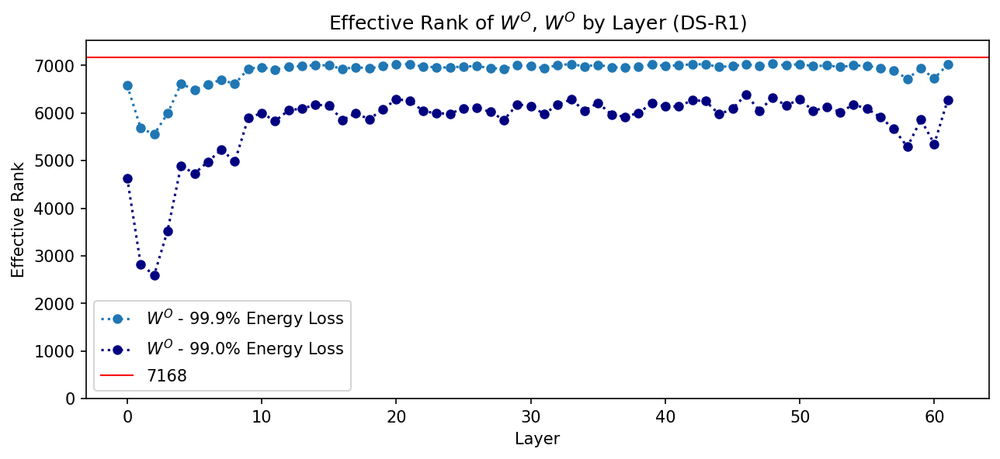

In [11]:
plot_ws = [
    ('O', '01', 'tab:blue'),
    ('O', '1', 'navy')
]

plot_layerwise_rank(
    plot_ws,
    num_layers,
    #dpi = 300
)

**DS-V3-base**

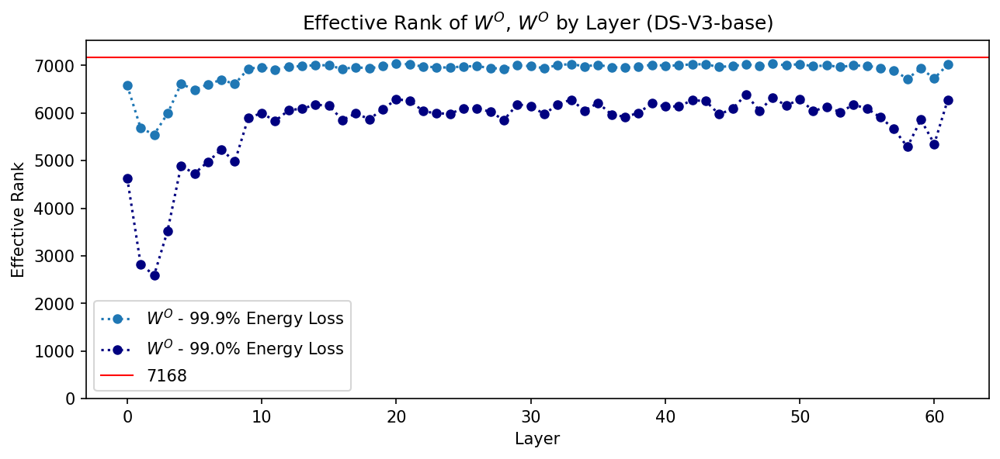

**Compare energy levels for $W^O$**

<img src='https://lh3.googleusercontent.com/d/1jM0tRYOOVTyOWiNRAXfl-umO3feFLMRK' alt='Plot showing the effective rank of the MLA output matrix across layers' width='900' />

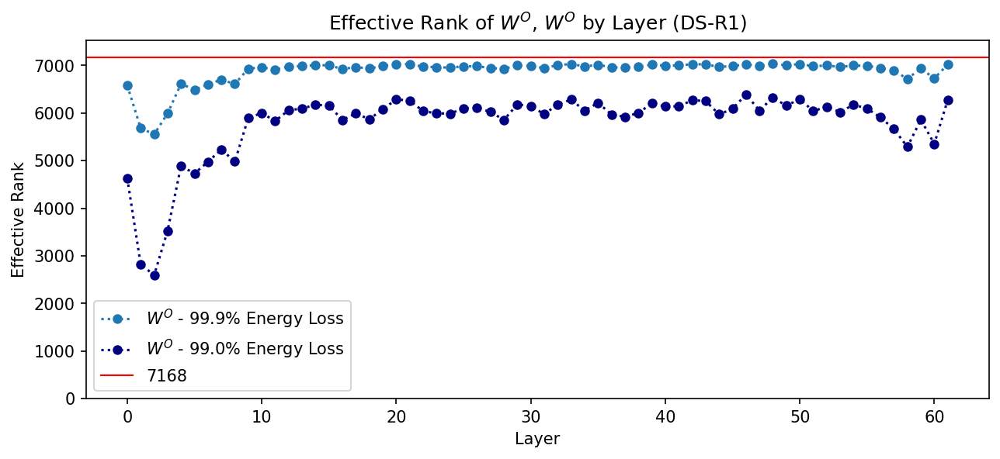

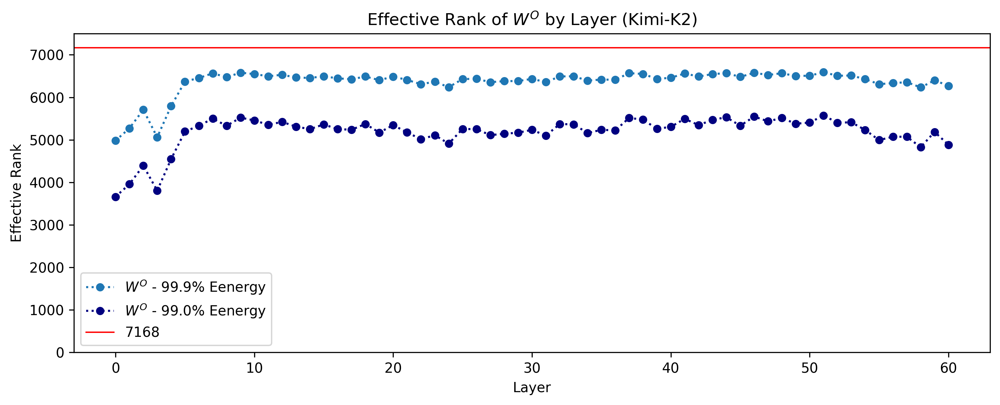

**DeepSeek-V3 Result**



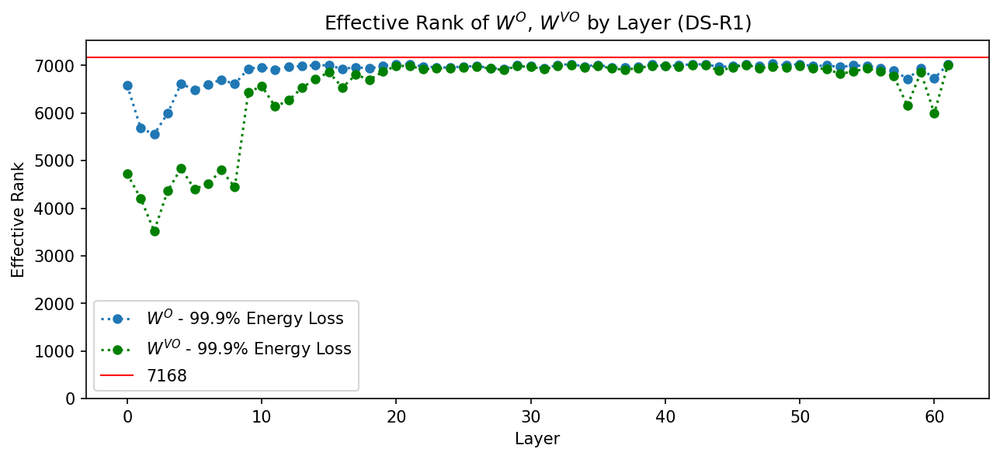

In [12]:
plot_ws = [
    ('O', '01', 'tab:blue'), #"1f77b4"
    ('VO','01', 'green')
]

plot_layerwise_rank(
    plot_ws,
    num_layers,
    #dpi = 300 # For creating illustrations
)

**DeepSeek-R1**

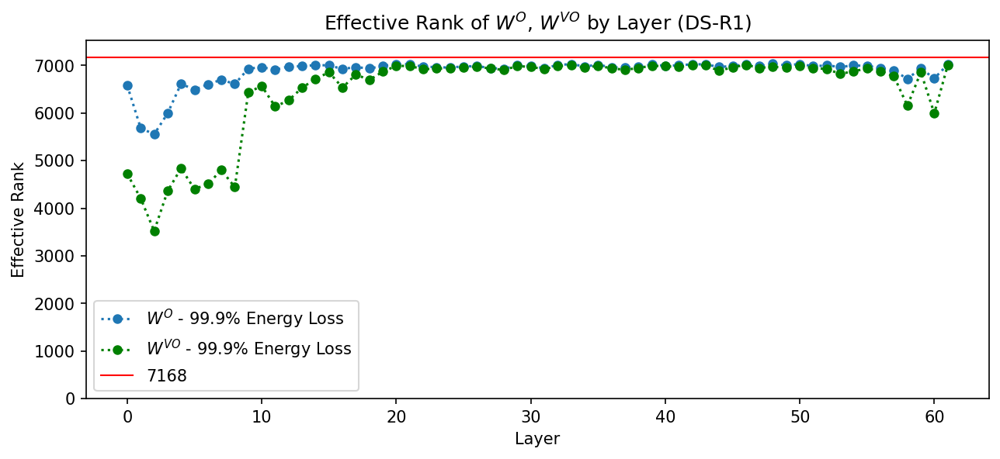

**DeepSeek-V3 for Comparison**

<img src='https://lh3.googleusercontent.com/d/11Zx11z5Jc71bnD9UsI-zlWqquFt6W2B1' alt='Plot showing the effective rank of the MLA output matrix compared to the fused version for all layers' width='900' />

**Kimi-K2**

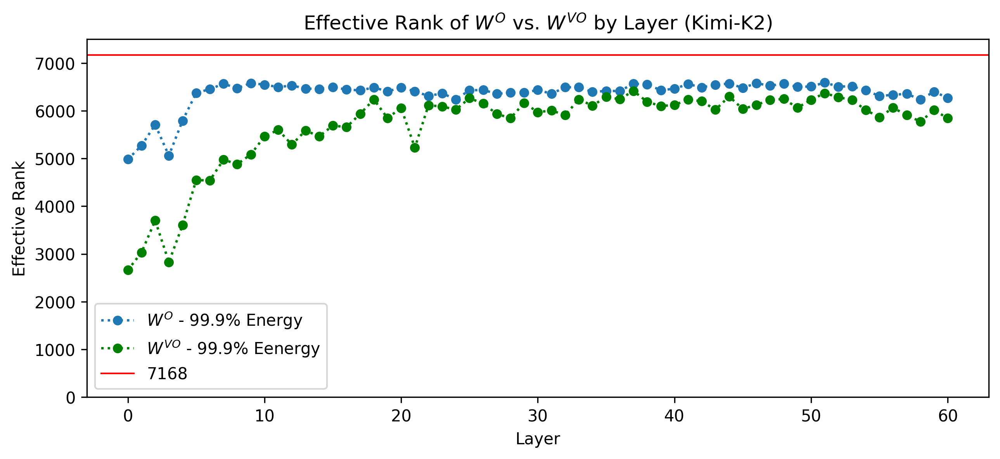

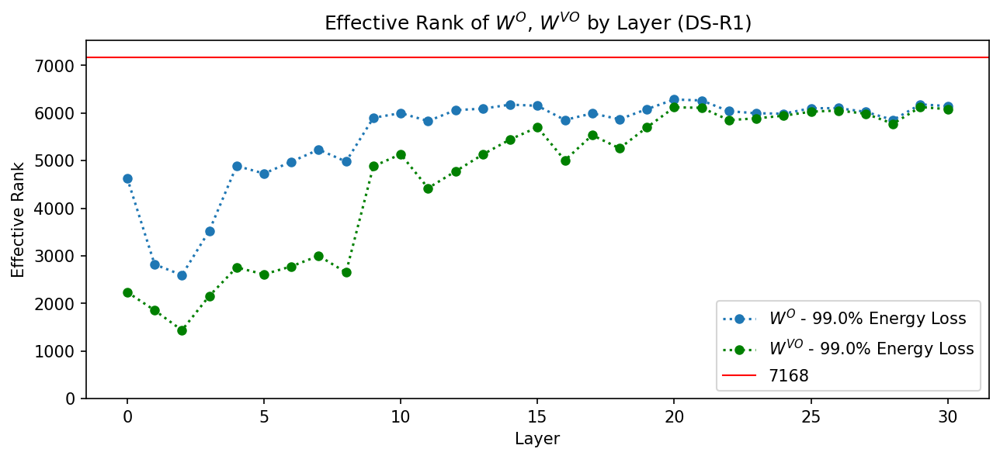

In [ ]:
plot_ws = [
    ('O', '1', 'tab:blue'), #"1f77b4"
    ('VO','1', 'green')
]

plot_layerwise_rank(
    plot_ws,
    num_layers,
    #dpi = 300 # For creating illustrations
)

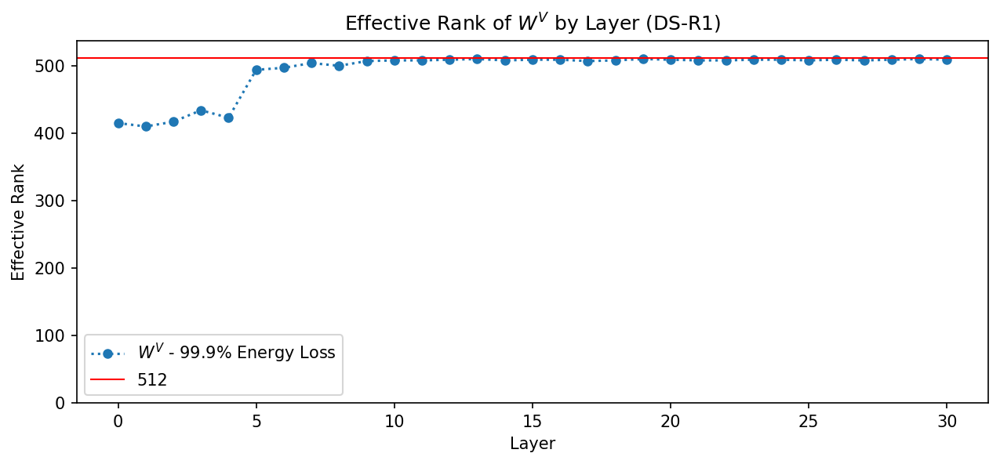

In [ ]:
plot_ws = [
    ('V', '01', 'tab:blue'), #"1f77b4
]

plot_layerwise_rank(
    plot_ws,
    num_layers,
    #dpi = 300 # For creating illustrations
)

Head-Wise $W^O$ and $W^{VO}$

/tmp/ipython-input-2659457857.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 4), dpi=dpi)


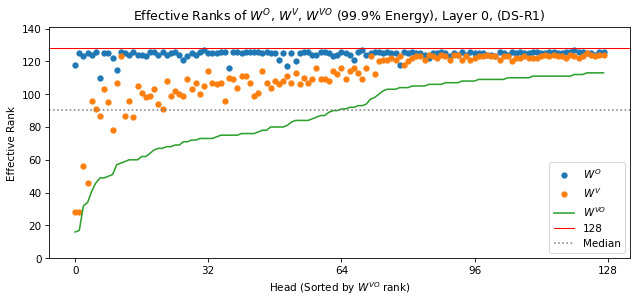

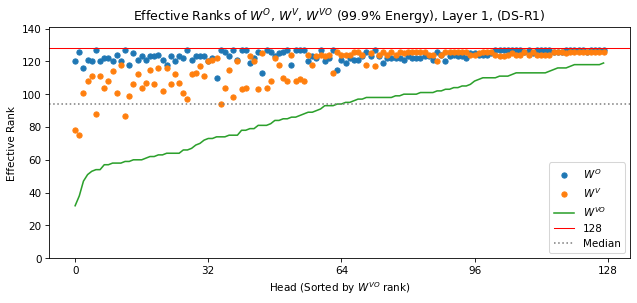

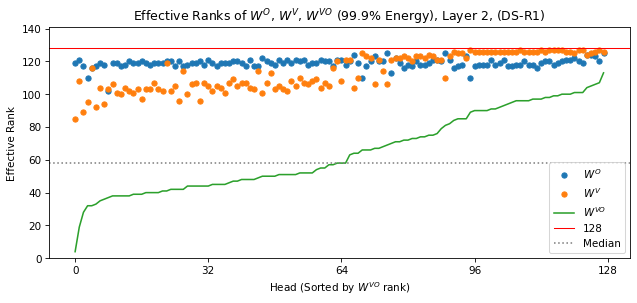

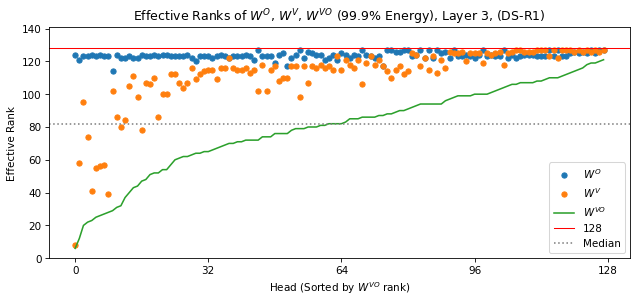

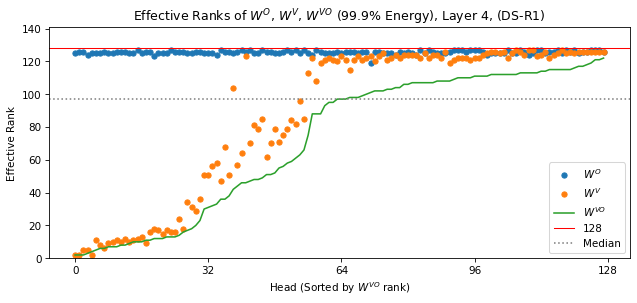

...

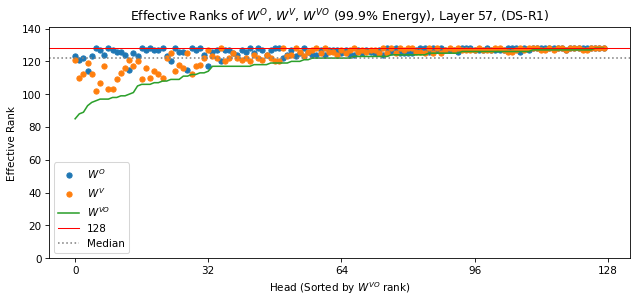

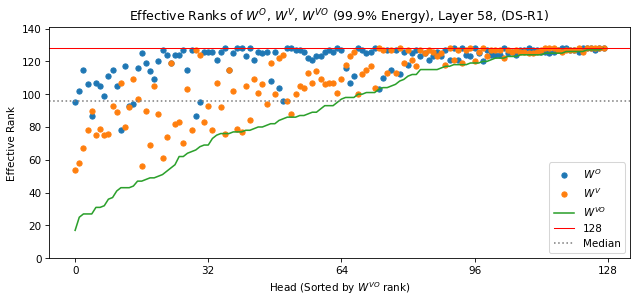

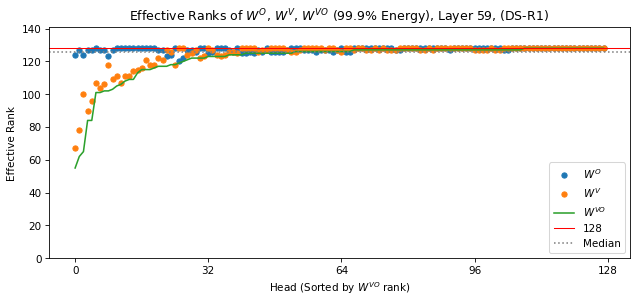

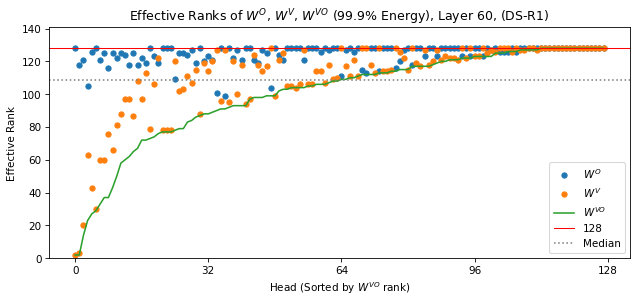

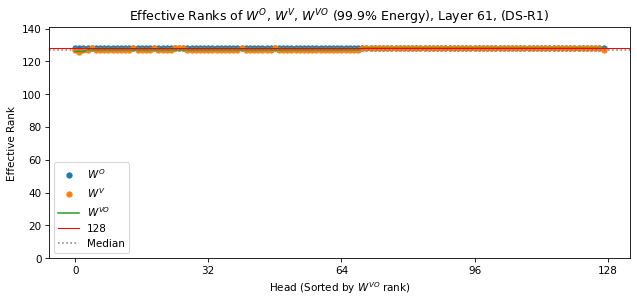

In [ ]:
# Loop through each layer and generate a plot
for layer_i in range(num_layers):

    median = plot_headwise_rank(
        layer_i=layer_i,
        plot_ws=[('O', 'scatter'), ('V', 'scatter'), ('VO', 'line')],
        sort_by='VO',
        pct_err='01',
        #dpi = 300  # For creating illustrations
        dpi = 75, # Low-res previews
    )o

    # To save the plot to a file:
    # plt.savefig(f"headwise_rank_layer_{layer_i}.png")
    # plt.close()


## 4.2. Query and Key

$W^Q$, $W^K$, and $W^{QK}$

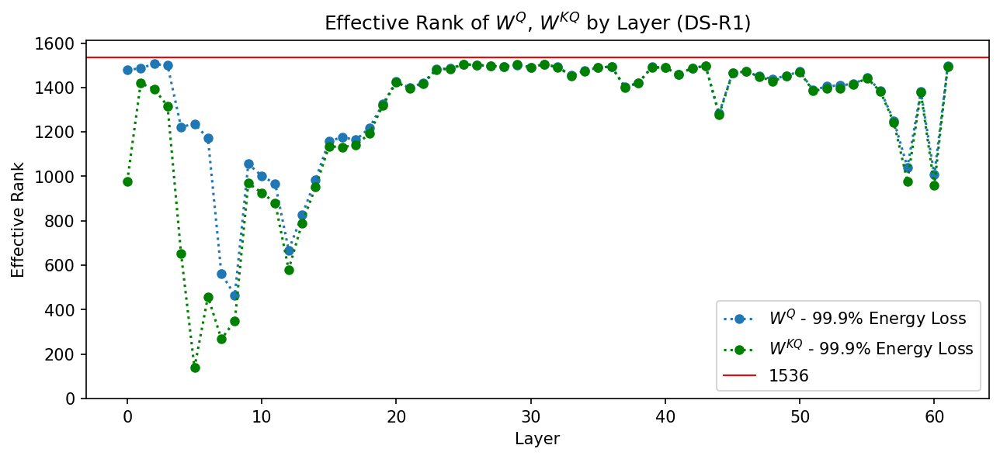

In [13]:
plot_ws = [
    ('Q', '01', 'tab:blue'), #"1f77b4"
    ('KQ','01', 'green')
]

plot_layerwise_rank(
    plot_ws,
    num_layers,
    #dpi = 300 # For creating illustrations
)

**DeepSeek-V3-Base**

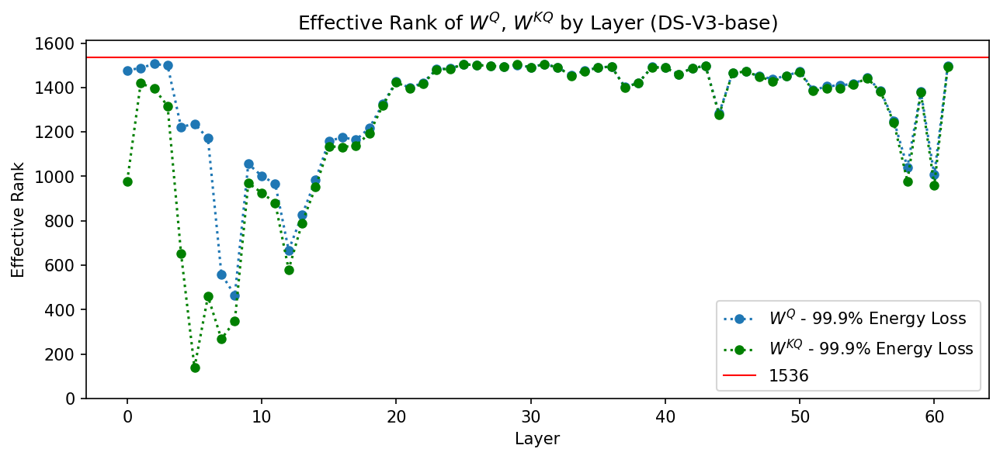

**DeepSeek-R1**

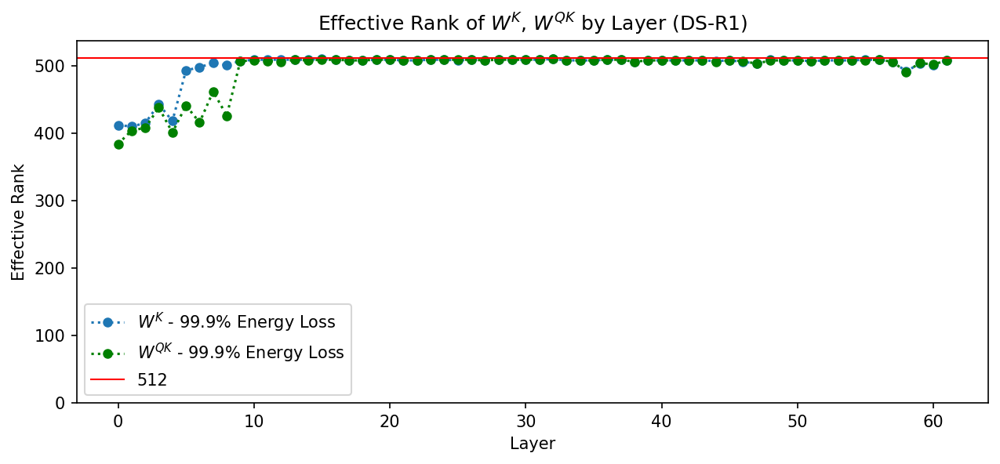

In [28]:
plot_ws = [
    ('K', '01', 'tab:blue'), #"1f77b4"
    ('QK','01', 'green')
]

plot_layerwise_rank(
    plot_ws,
    num_layers,
    #dpi = 300 # For creating illustrations
)

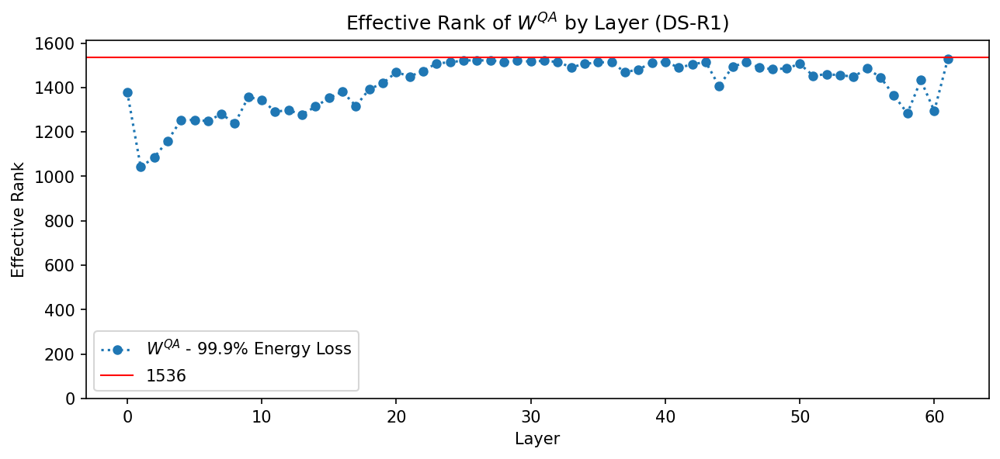

In [29]:
plot_ws = [
    ('QA', '01', 'tab:blue'), #"1f77b4"
]

plot_layerwise_rank(
    plot_ws,
    num_layers,
    #dpi = 300 # For creating illustrations
)

**DeepSeek-R1**

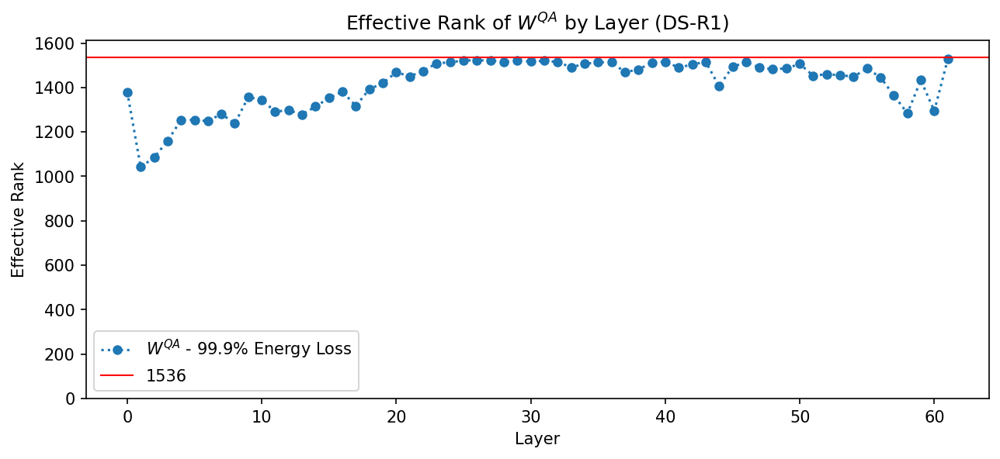

## 4.3. Key and Value

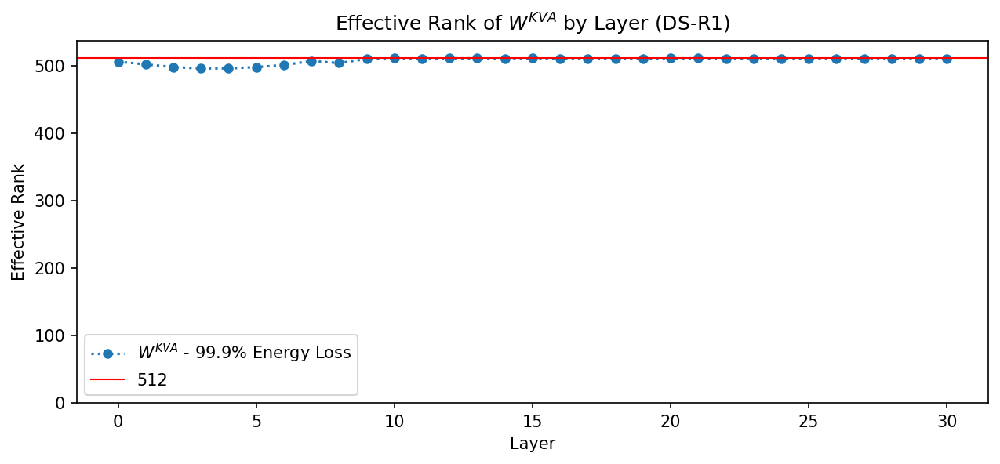

In [ ]:
plot_ws = [
    ('KVA', '01', 'tab:blue'), #"1f77b4"
]

plot_layerwise_rank(
    plot_ws,
    num_layers,
    #dpi = 300 # For creating illustrations
)

**All Key Heads**

/tmp/ipython-input-3596061454.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 4), dpi=dpi)


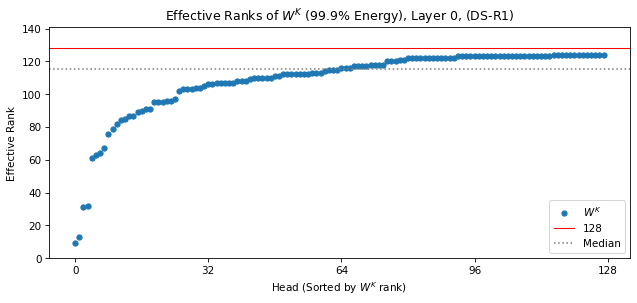

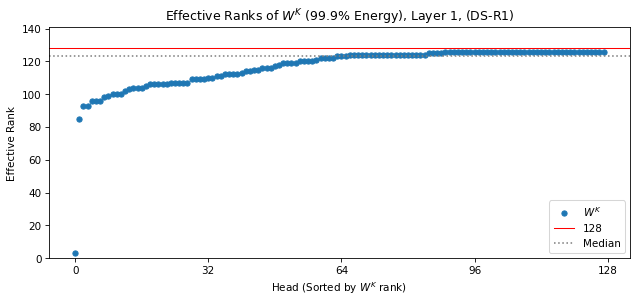

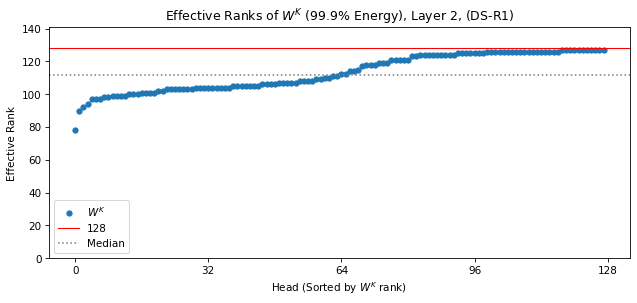

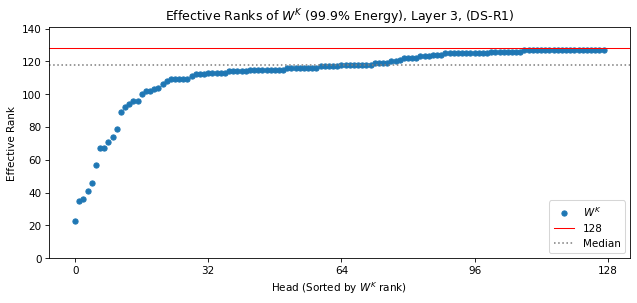

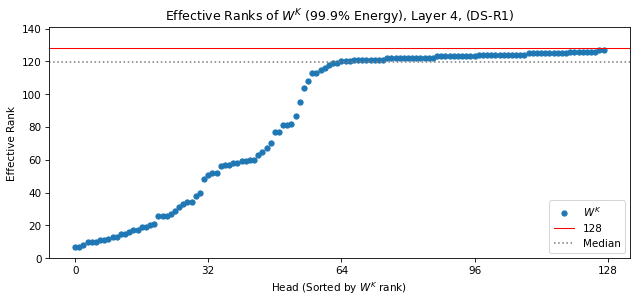

...

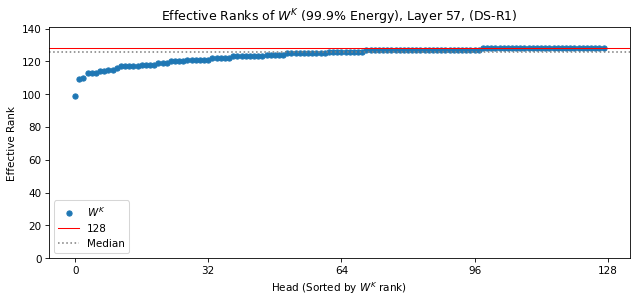

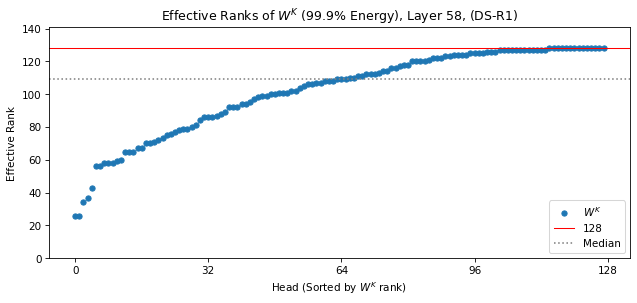

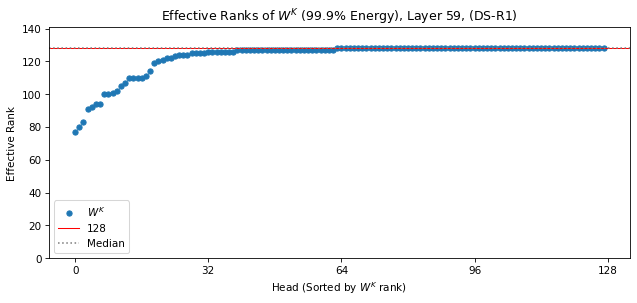

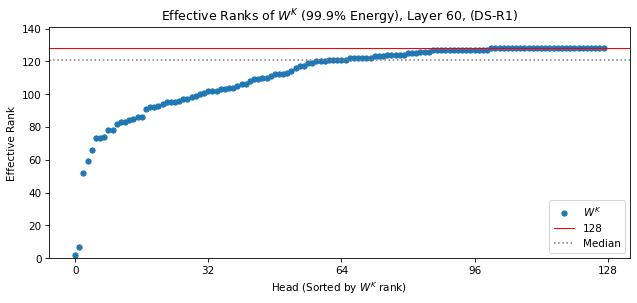

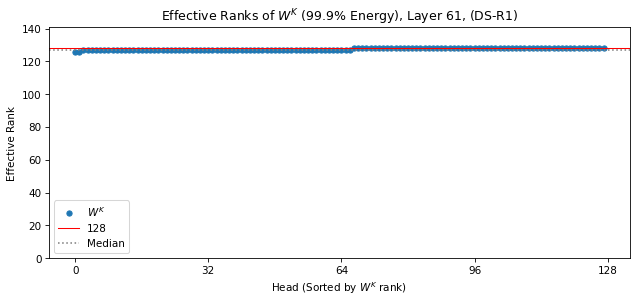

In [32]:
# Loop through each layer and generate a plot
for layer_i in range(num_layers):
    median = plot_headwise_rank(
        layer_i=layer_i,
        plot_ws=[('K', 'scatter')],
        sort_by='K',
        pct_err='01',
        dpi = 75
    )

    # To save the plot to a file:
    # plt.savefig(f"headwise_rank_layer_{layer_i}.png")
    # plt.close()


**All Value Heads**

/tmp/ipython-input-3596061454.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 4), dpi=dpi)


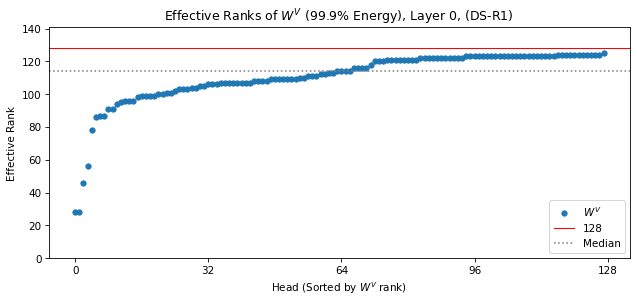

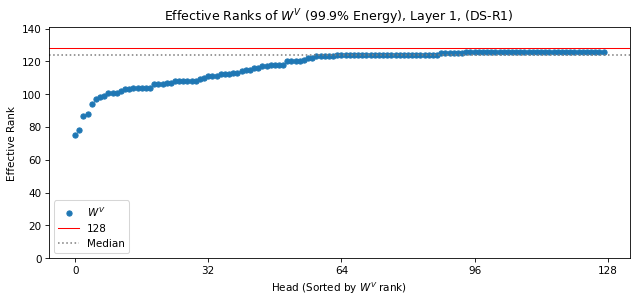

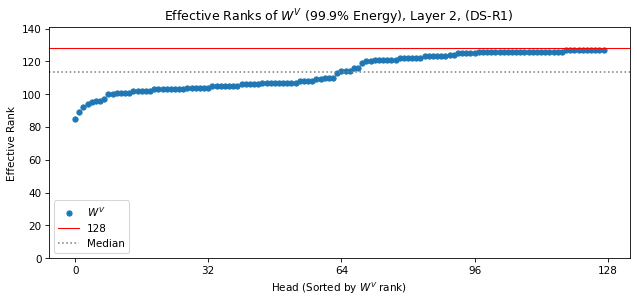

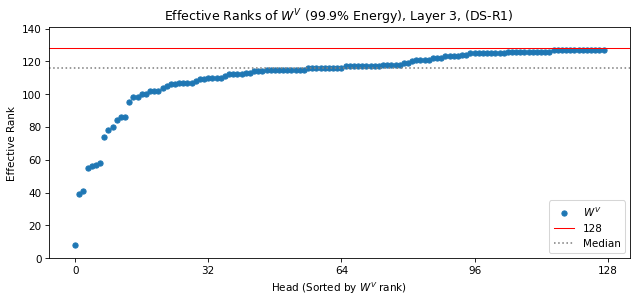

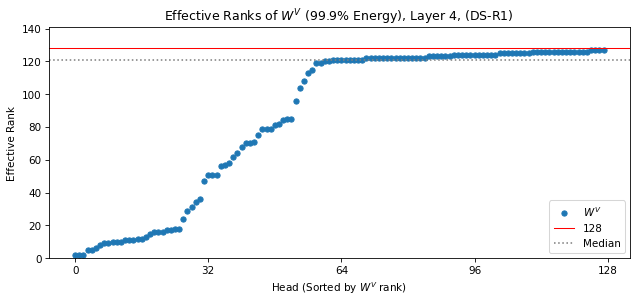

...

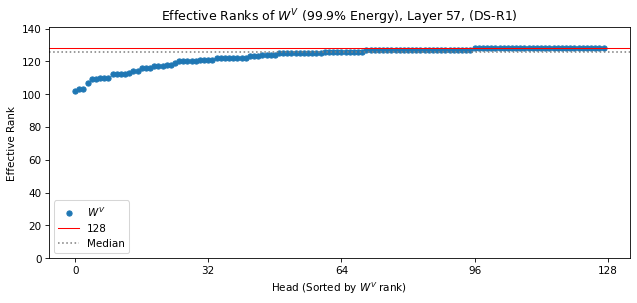

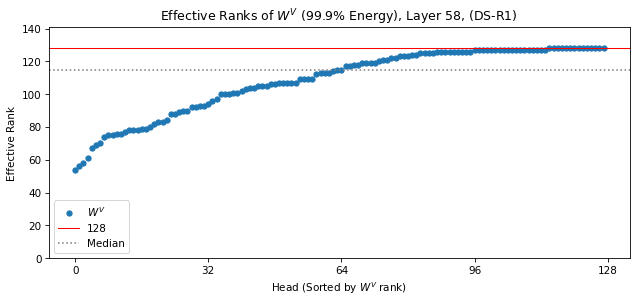

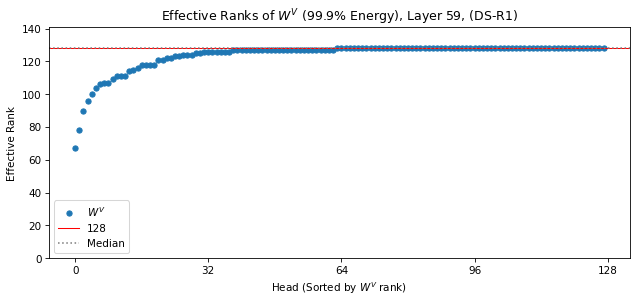

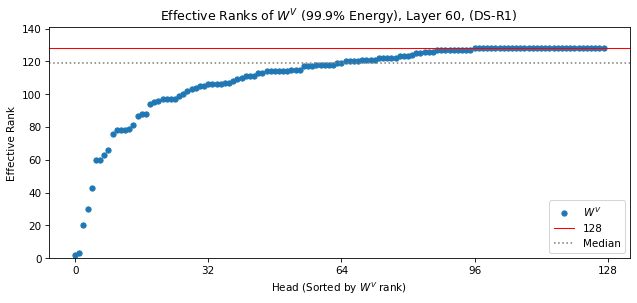

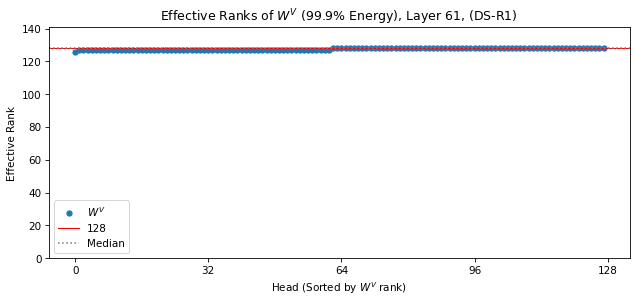

In [33]:
# Loop through each layer and generate a plot
for layer_i in range(num_layers):
    median = plot_headwise_rank(
        layer_i=layer_i,
        plot_ws=[('V', 'scatter')],
        sort_by='V',
        pct_err='01',
        dpi = 75
    )

    # To save the plot to a file:
    # plt.savefig(f"headwise_rank_layer_{layer_i}.png")
    # plt.close()


**Corresponding Key & Value**

/tmp/ipython-input-3596061454.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 4), dpi=dpi)


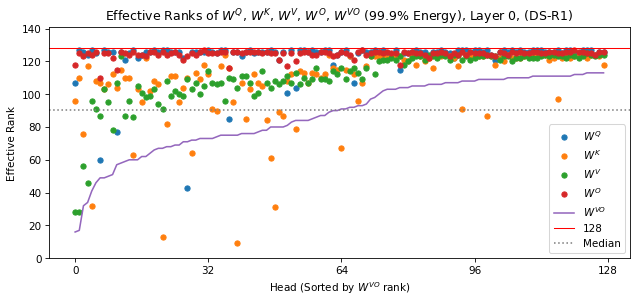

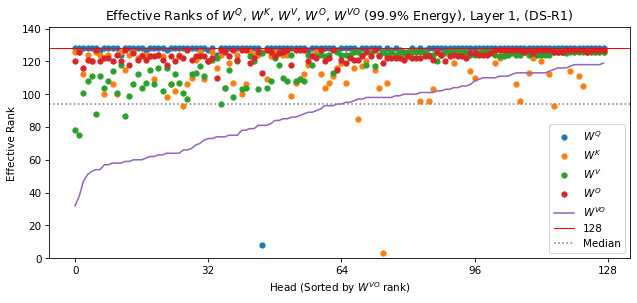

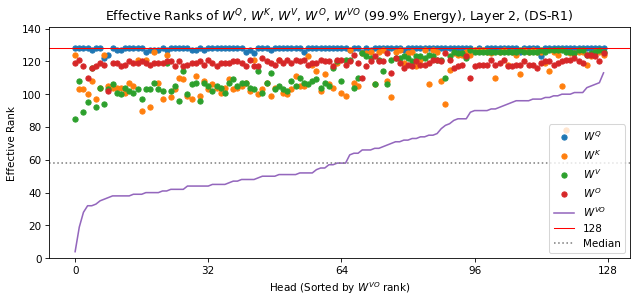

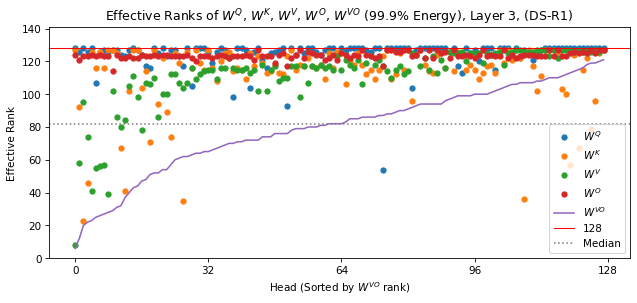

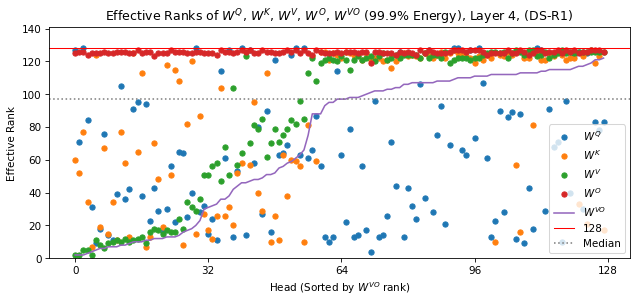

...

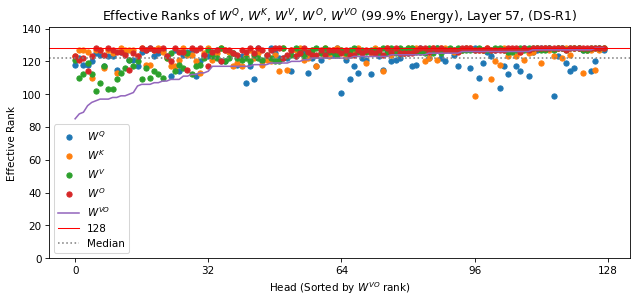

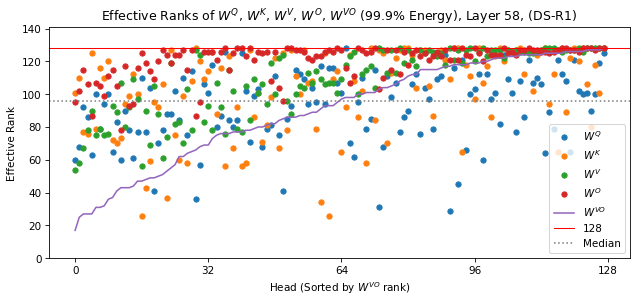

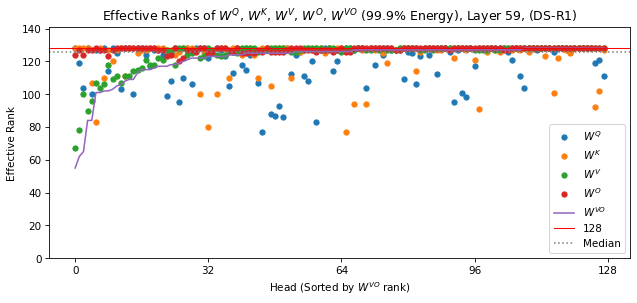

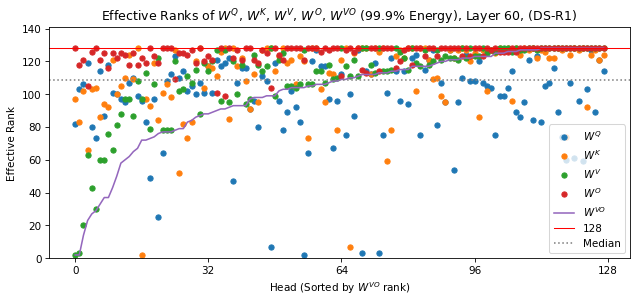

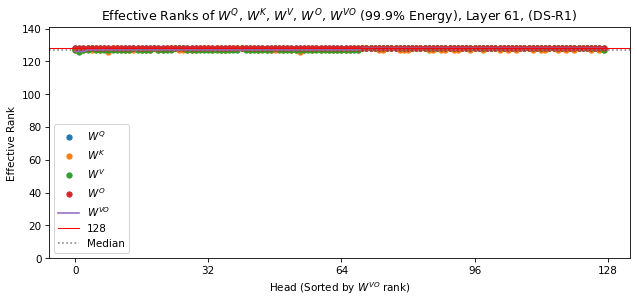

In [35]:
# Loop through each layer and generate a plot
for layer_i in range(num_layers):
    median = plot_headwise_rank(
        layer_i=layer_i,
        plot_ws=[('Q', 'scatter'), ('K', 'scatter'), ('V', 'scatter'), ('O', 'scatter'), ('VO', 'line')],
        sort_by='VO',
        pct_err='01',
        dpi = 75
    )

    # To save the plot to a file:
    # plt.savefig(f"headwise_rank_layer_{layer_i}.png")
    # plt.close()



/tmp/ipython-input-3596061454.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 4), dpi=dpi)


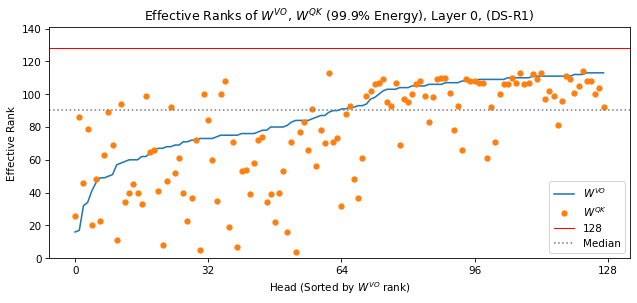

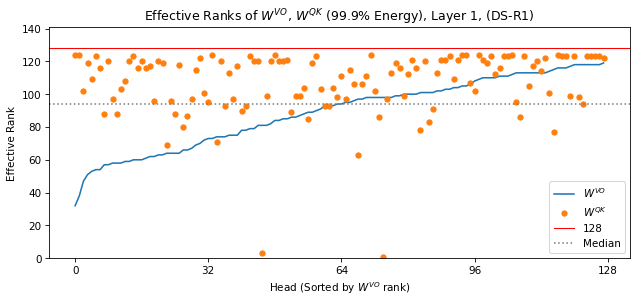

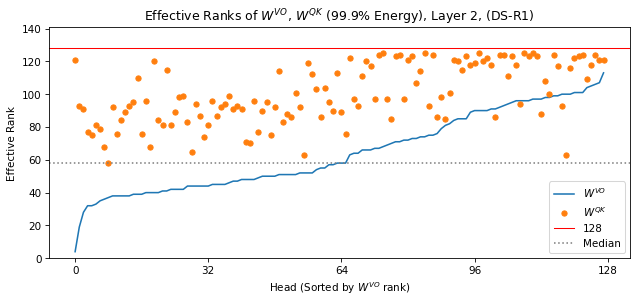

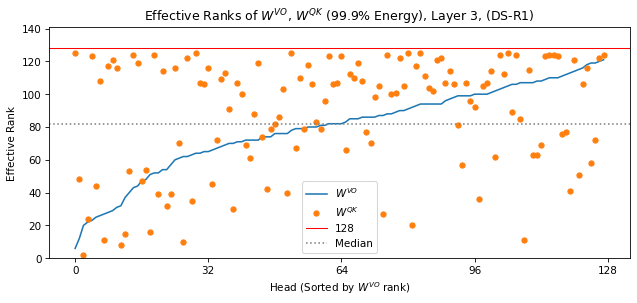

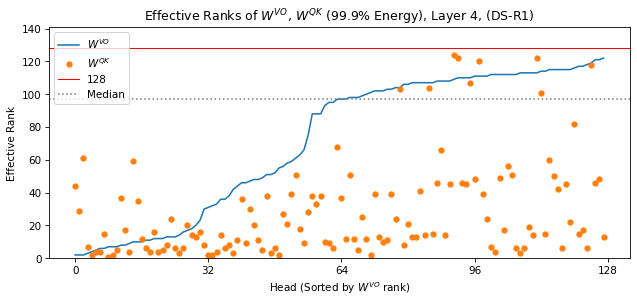

...

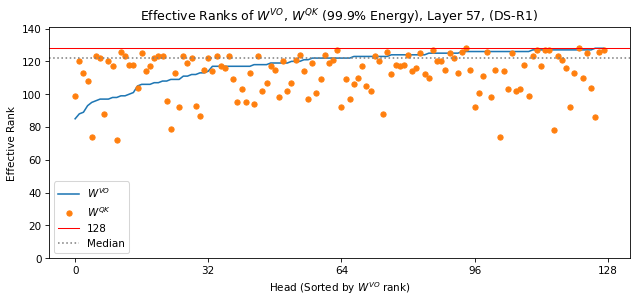

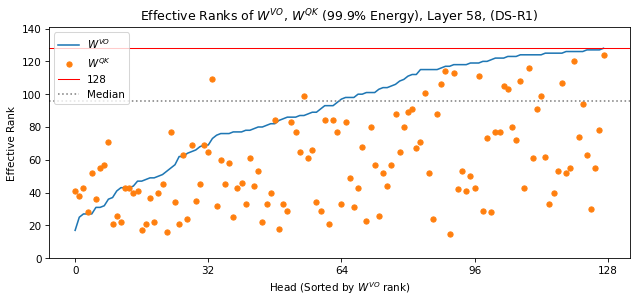

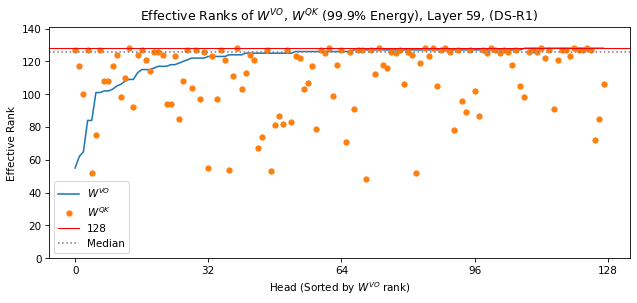

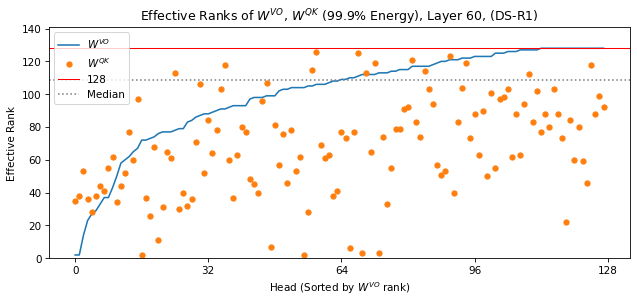

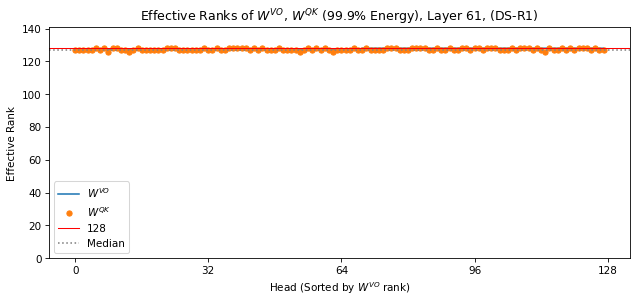

In [37]:
# Loop through each layer and generate a plot
for layer_i in range(num_layers):
    median = plot_headwise_rank(
        layer_i=layer_i,
        plot_ws=[('VO', 'line'), ('QK', 'scatter')],
        sort_by='VO',
        pct_err='01',
        dpi = 75
    )

    # To save the plot to a file:
    # plt.savefig(f"headwise_rank_layer_{layer_i}.png")
    # plt.close()



## 4.4. RoPE Heads

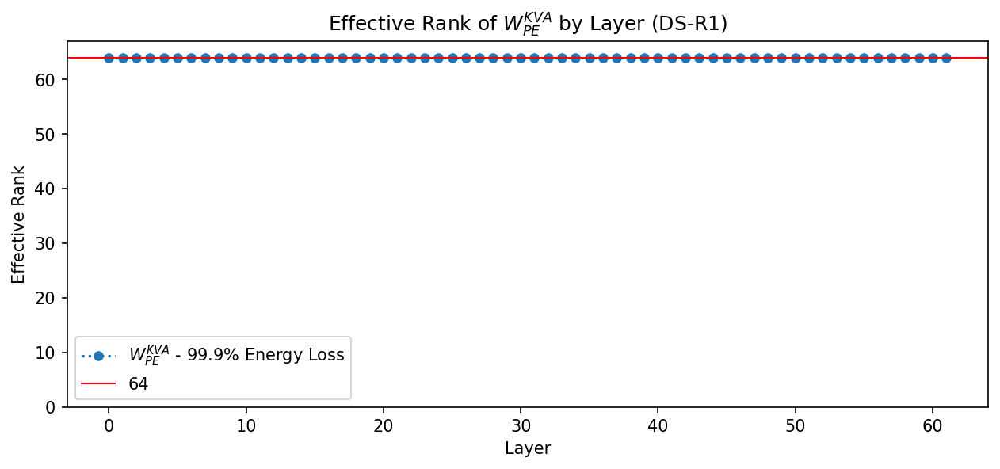

In [ ]:
plot_ws = [
    ('KVA_pe', '01', 'tab:blue'), #"1f77b4"
]

plot_layerwise_rank(
    plot_ws,
    num_layers,
    #dpi = 300 # For creating illustrations
)

# ▂▂▂▂▂▂▂▂▂▂▂▂

# In Progress

## Comparison Across Models

### DS-V3 vs. Kimi-K2

It would be interesting to plot these two models together--they're nearly identical in architecture, and Kimi-K2 is the 'newer and better' of the two. Haven't done this yet.

### Singular Value Diffs between DS-V3 Variants

Running the code for both DeepSeek-V3-Base and DeepSeek-R1, there's very little difference in effective ranks. In fact, I couldn't see _any_ difference, so I was worried I screwed something up.

I had Gemini write the below to compare the effective ranks for the two models--turns out they're just nearly identical!

In [ ]:
import pickle
import numpy as np
import pandas as pd
from huggingface_hub import hf_hub_download

def get_rank_for_error_threshold(S_values, error_threshold):
    """
    Calculates the minimum rank required to keep reconstruction error below a threshold.
    """
    energy = S_values**2
    total_energy = np.sum(energy)
    if total_energy == 0:
        return 0
    cumulative_energy_kept = np.cumsum(energy)
    fraction_of_energy_lost = 1.0 - (cumulative_energy_kept / total_energy)
    valid_ranks = np.where(fraction_of_energy_lost <= error_threshold)[0]
    if len(valid_ranks) == 0:
        return len(S_values)
    required_rank = valid_ranks[0] + 1
    return required_rank

def get_model_data(model_name):
    """
    Loads singular value data for a given model.
    """
    if model_name == "DS-V3-base":
        SINGULAR_VALS_FILE = "ds-v3-base_singular_values.pkl"
        num_layers = 62
        num_heads = 128
        vals_available = True
    elif model_name == "DS-R1":
        SINGULAR_VALS_FILE = "ds-r1_singular_values.pkl"
        num_layers = 62
        num_heads = 128
        vals_available = True
    else:
        raise ValueError(f"Unknown model: {model_name}")

    print(f"Loading data for model: {model_name}")
    assert vals_available, "Singular values not available for this model yet."
    path = hf_hub_download(
        repo_id="ChrisMcCormick/svd-attn-singvals",
        filename=SINGULAR_VALS_FILE,
        repo_type="dataset",
    )
    with open(path, "rb") as f:
        (S_subspaces, S_heads, S_stacked_heads) = pickle.load(f)
    return S_subspaces, S_heads, S_stacked_heads, num_layers, num_heads

def calculate_effective_ranks(S_subspaces, S_heads, S_stacked_heads, num_layers, num_heads):
    """
    Calculates effective ranks at 1% and 0.1% error.
    """
    ranks = {"at_1_pct": {}, "at_01_pct": {}}
    for error_key, error_val in [("at_1_pct", 0.01), ("at_01_pct", 0.001)]:
        ranks[error_key] = {
            "stacked_heads": {}, "heads": {}, "subspaces": {}
        }
        # Subspaces
        for W_name in ['KVA', 'KVA_pe', 'QA']:
            ranks[error_key]["subspaces"][W_name] = [
                get_rank_for_error_threshold(S_subspaces[layer_i][W_name], error_val)
                for layer_i in range(num_layers)
            ]
        # Stacked Heads
        for W_name in ['Q', 'Q_pe', 'K', 'V', 'QK', 'KQ', 'O', 'VO']:
            ranks[error_key]["stacked_heads"][W_name] = [
                get_rank_for_error_threshold(S_stacked_heads[layer_i][W_name], error_val)
                for layer_i in range(num_layers)
            ]
        # Individual Heads
        for W_name in ['Q', 'Q_pe', 'K', 'V', 'QK', 'O', 'VO']:
            ranks[error_key]["heads"][W_name] = {
                layer_i: [
                    get_rank_for_error_threshold(S_heads[layer_i][W_name][head_i], error_val)
                    for head_i in range(num_heads)
                ]
                for layer_i in range(num_layers)
            }
    return ranks["at_1_pct"], ranks["at_01_pct"]

def compare_and_create_dataframe(ranks1, ranks2, model1_name, model2_name, threshold=1):
    """
    Compares two sets of effective ranks and returns a DataFrame with the differences.
    """
    results = []

    # Subspaces
    for W_name in ranks1["subspaces"]:
        if W_name == 'KVA_pe':  # Skip malformed subspace
            continue
        for layer_i in range(len(ranks1["subspaces"][W_name])):
            rank1 = ranks1["subspaces"][W_name][layer_i]
            rank2 = ranks2["subspaces"][W_name][layer_i]
            diff = abs(rank1 - rank2)
            if diff > threshold:
                results.append({
                    "Component Type": "Subspace",
                    "W_name": W_name, "Layer": layer_i, "Head": "N/A",
                    f"{model1_name} Rank": rank1, f"{model2_name} Rank": rank2,
                    "Difference": diff
                })

    # Stacked Heads
    for W_name in ranks1["stacked_heads"]:
        for layer_i in range(len(ranks1["stacked_heads"][W_name])):
            rank1 = ranks1["stacked_heads"][W_name][layer_i]
            rank2 = ranks2["stacked_heads"][W_name][layer_i]
            diff = abs(rank1 - rank2)
            if diff > threshold:
                results.append({
                    "Component Type": "Stacked Head",
                    "W_name": W_name, "Layer": layer_i, "Head": "N/A",
                    f"{model1_name} Rank": rank1, f"{model2_name} Rank": rank2,
                    "Difference": diff
                })

    # Individual Heads
    for W_name in ranks1["heads"]:
        for layer_i in ranks1["heads"][W_name]:
            for head_i in range(len(ranks1["heads"][W_name][layer_i])):
                rank1 = ranks1["heads"][W_name][layer_i][head_i]
                rank2 = ranks2["heads"][W_name][layer_i][head_i]
                diff = abs(rank1 - rank2)
                if diff > threshold:
                    results.append({
                        "Component Type": "Individual Head",
                        "W_name": W_name, "Layer": layer_i, "Head": head_i,
                        f"{model1_name} Rank": rank1, f"{model2_name} Rank": rank2,
                        "Difference": diff
                    })

    # Create and sort the DataFrame
    df = pd.DataFrame(results)
    if not df.empty:
        df = df.sort_values(by="Difference", ascending=False).reset_index(drop=True)

    return df

# --- Main Script ---

# Get data and calculate ranks for both models
S_subspaces_r1, S_heads_r1, S_stacked_heads_r1, num_layers_r1, num_heads_r1 = get_model_data("DS-R1")
at_1_pct_r1, at_01_pct_r1 = calculate_effective_ranks(S_subspaces_r1, S_heads_r1, S_stacked_heads_r1, num_layers_r1, num_heads_r1)

S_subspaces_v3, S_heads_v3, S_stacked_heads_v3, num_layers_v3, num_heads_v3 = get_model_data("DS-V3-base")
at_1_pct_v3, at_01_pct_v3 = calculate_effective_ranks(S_subspaces_v3, S_heads_v3, S_stacked_heads_v3, num_layers_v3, num_heads_v3)


Loading data for model: DS-R1


/tmp/ipython-input-3456045978.py:10: RuntimeWarning: overflow encountered in square
  energy = S_values**2


Loading data for model: DS-V3-base

--- Comparison at 0.1% Error (Difference > 1) ---


,Component Type,W_name,Layer,Head,DS-R1 Rank,DS-V3-base Rank,Difference
0,Stacked Head,VO,0,N/A,4719,4735,16
1,Stacked Head,K,1,N/A,410,415,5
2,Stacked Head,QK,1,N/A,404,409,5
3,Stacked Head,V,1,N/A,410,415,5
4,Stacked Head,O,2,N/A,5552,5548,4
5,Stacked Head,K,3,N/A,443,447,4
6,Stacked Head,QK,3,N/A,438,442,4
7,Stacked Head,V,3,N/A,434,438,4
8,Individual Head,Q,60,113,47,43,4
9,Stacked Head,VO,2,N/A,3520,3516,4


## Grid Plots for All Layers

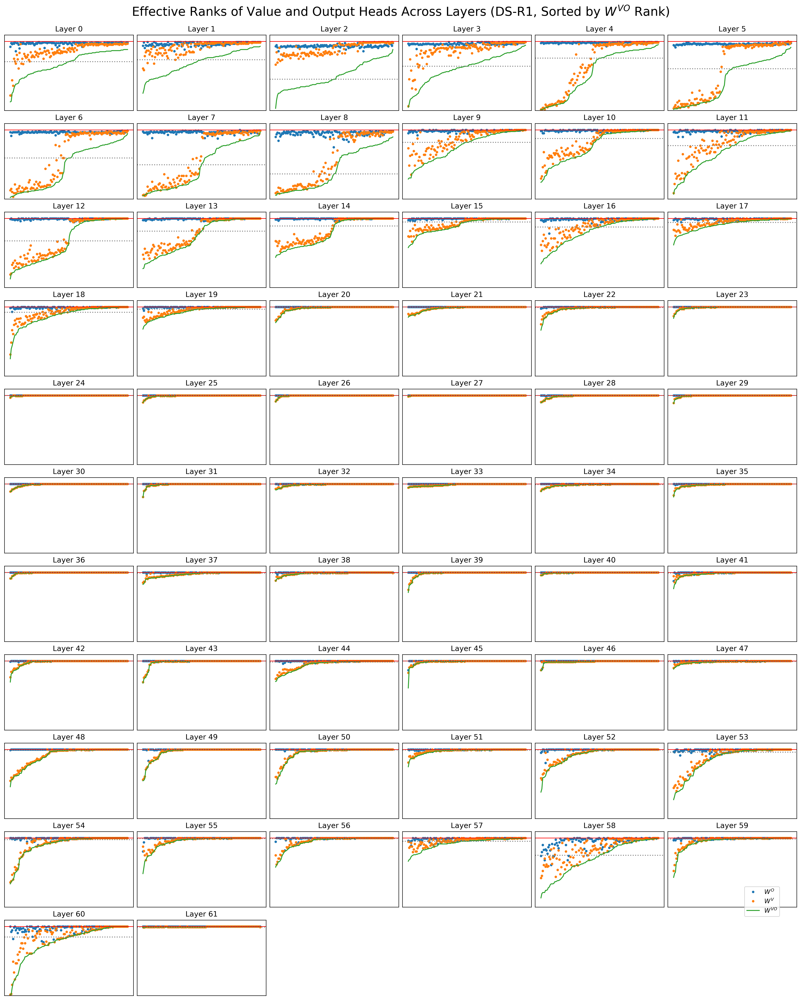

In [57]:
import numpy as np

import matplotlib.pyplot as plt


fig, axs = plt.subplots(
    11, 6,
    figsize=(18, 22),
    dpi=300,

    # Reduce the margins between plots
    constrained_layout=True,

    # Define the layout with small padding
    gridspec_kw={
        'hspace': 0.01,
        'wspace': 0.01,
    }
)

axs = axs.flatten()  # Flatten the 2D grid to index easily

# For each layer...
for layer_i in range(num_layers):

    # Get the next subplot "axis"
    ax = axs[layer_i]

    # Define x-axis values
    heads = np.arange(num_heads)

    # 1. Get the rank values for the 'VO' matrix at this layer
    #    (Convert to a NumPy array for sorting)
    sort_ranks = np.array(at_01_pct['heads']['VO'][layer_i])

    # 2. Get the indices that would sort these ranks
    indices = np.argsort(sort_ranks)


    # Convert lists to NumPy arrays before applying the sorting 'indices'

    # Plot W^O ranks
    ax.plot(
        heads,
        np.array(at_01_pct["heads"]['O'][layer_i])[indices],
        marker='o',
        markersize=3,
        linestyle='',
        label=r"$W^O$"
    )

    # Plot W^V ranks
    ax.plot(
        heads,
        np.array(at_01_pct["heads"]['V'][layer_i])[indices],
        marker='o',
        markersize=3, # Smaller marker size for clarity
        linestyle='',
        label=r"$W^V$"
    )

    # Plot the merged W^VO ranks as a line
    ax.plot(
        heads,
        sort_ranks[indices], # Already a sorted numpy array
        label=r"$W^{VO}$"
    )

    # --- Add annotations and styling to the subplot ---

    # Plot a horizontal line at the max possible rank
    max_rank = 128
    ax.axhline(y=max_rank, color='red', linewidth=1, linestyle='-')

    # Plot a horizontal line at the median rank
    median_rank = np.median(sort_ranks)
    ax.axhline(y=median_rank, color='grey', linestyle='dotted')

    # Set subplot title and remove ticks for a cleaner look
    ax.set_title(f"Layer {layer_i}")
    ax.set_ylim(0, 140)
    ax.set_xticks([])
    ax.set_yticks([])

# --- Final Figure-Level Adjustments ---

# Set the main title for the entire figure (AFTER the loop)
fig.suptitle(f"Effective Ranks of Value and Output Heads Across Layers ({model_name}, Sorted by $W^{{VO}}$ Rank)", fontsize=20, y=1.02)

# Hide any unused subplots in the grid
for i in range(num_layers, len(axs)):
    axs[i].set_visible(False)

# Add a single legend for the whole figure
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right', bbox_to_anchor=(0.98, 0.08))

plt.show()


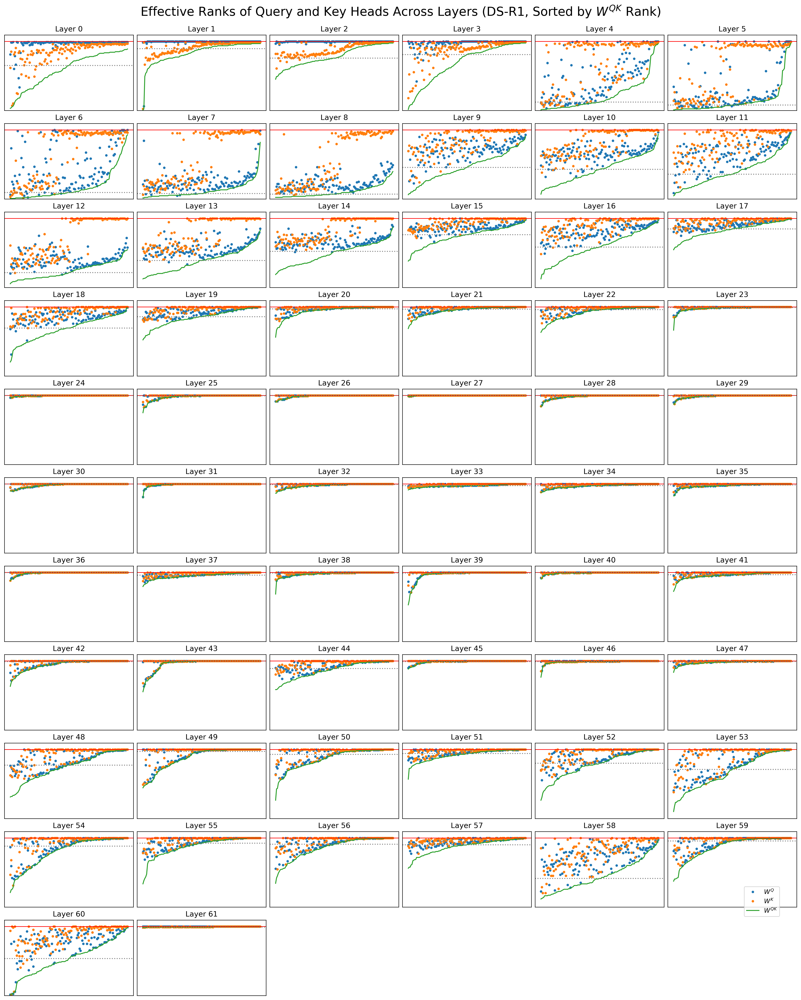

In [ ]:
import numpy as np

import matplotlib.pyplot as plt


fig, axs = plt.subplots(
    11, 6,
    figsize=(18, 22),
    dpi=300,

    # Reduce the margins between plots
    constrained_layout=True,

    # Define the layout with small padding
    gridspec_kw={
        'hspace': 0.01,
        'wspace': 0.01,
    }
)

axs = axs.flatten()  # Flatten the 2D grid to index easily

# For each layer...
for layer_i in range(num_layers):

    # Get the next subplot "axis"
    ax = axs[layer_i]

    # Define x-axis values
    heads = np.arange(num_heads)

    # 1. Get the rank values for the 'QK' matrix at this layer
    #    (Convert to a NumPy array for sorting)
    sort_ranks = np.array(at_01_pct['heads']['QK'][layer_i])

    # 2. Get the indices that would sort these ranks
    indices = np.argsort(sort_ranks)

    # --- Plot the data for Q, K, and QK ---
    # Convert lists to NumPy arrays before applying the sorting 'indices'

    # Plot W^Q ranks
    ax.plot(
        heads,
        np.array(at_01_pct["heads"]['Q'][layer_i])[indices],
        marker='o',
        markersize=3, # Smaller marker size for clarity
        linestyle='',
        label=r"$W^Q$"
    )

    # Plot W^K ranks
    ax.plot(
        heads,
        np.array(at_01_pct["heads"]['K'][layer_i])[indices],
        marker='o',
        markersize=3,
        linestyle='',
        label=r"$W^K$"
    )

    # Plot the merged W^QK ranks as a line
    ax.plot(
        heads,
        sort_ranks[indices], # Already a sorted numpy array
        label=r"$W^{QK}$"
    )

    # --- Add annotations and styling to the subplot ---

    # Plot a horizontal line at the max possible rank
    max_rank = 128
    ax.axhline(y=max_rank, color='red', linewidth=1, linestyle='-')

    # Plot a horizontal line at the median rank
    median_rank = np.median(sort_ranks)
    ax.axhline(y=median_rank, color='grey', linestyle='dotted')

    # Set subplot title and remove ticks for a cleaner look
    ax.set_title(f"Layer {layer_i}")
    ax.set_ylim(0, 140)
    ax.set_xticks([])
    ax.set_yticks([])

# --- Final Figure-Level Adjustments ---

# Set the main title for the entire figure (AFTER the loop)
fig.suptitle(f"Effective Ranks of Query and Key Heads Across Layers ({model_name}, Sorted by $W^{{QK}}$ Rank)", fontsize=20, y=1.02)

# Hide any unused subplots in the grid
for i in range(num_layers, len(axs)):
    axs[i].set_visible(False)

# Add a single legend for the whole figure
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower right', bbox_to_anchor=(0.98, 0.08))

plt.show()
